# Data Loading

In [1]:
import os
import glob
import pandas as pd
import json

# Path to the directory containing the JSON files
folder_path = 'results/'

# Get all JSON files in the directory
json_files = glob.glob(os.path.join(folder_path, '*.json'))

# Initialize empty lists to store DataFrames
client_dfs = []
server_dfs = []
central_dfs = []

# Iterate through each JSON file
for file in json_files:
    with open(file, 'r') as f:
        data = json.load(f)
    
    # Read JSON data and convert it to DataFrame
    df = pd.json_normalize(data)
    
    # Check the name to decide which DataFrame to append to
    if os.path.basename(file).startswith('labels_distribution_skew_balancing_client'):
        client_dfs.append(df)
    elif os.path.basename(file).startswith('labels_distribution_skew_balancing_server'):
        server_dfs.append(df)
    elif os.path.basename(file).startswith('labels_distribution_skew_balancing_central'):
        central_dfs.append(df)
    #elif os.path.basename(file).startswith('central'):
    #    central_dfs.append(df)


# Concatenate the lists of DataFrames into single DataFrames
client_df = pd.concat(client_dfs, ignore_index=True)
server_df = pd.concat(server_dfs, ignore_index=True)
central_df = pd.concat(central_dfs, ignore_index=True)

# Now you have three DataFrames: client_df, server_df, and central_df
# Columns to drop
client_columns_to_drop = ["output", "heterogeneity", "type", "seed","federated_rounds","federated_local_epochs","number_of_clusters"]
client_df.drop(columns=client_columns_to_drop, inplace=True)
server_columns_to_drop = ["output", "heterogeneity", "type", "seed","number_of_clusters"]
server_df.drop(columns=server_columns_to_drop, inplace=True)

new_column_names = {"number_of_clients": "clients", "number_of_samples_of_each_labels_by_clients": "samples"}
central_df.rename(columns=new_column_names, inplace=True)
# Rename the columns in each DataFrame
new_column_names = {"number_of_clients": "clients", "number_of_samples_of_each_labels_by_clients": "samples","davies_bouldin_index": "dbi"}
client_df.rename(columns=new_column_names, inplace=True)
server_df.rename(columns=new_column_names, inplace=True)
central_df.transpose()


,0,1
seed,42,42
clients,240,48
samples,20,100
centralized_model_epochs,200,200
federated_rounds,200,100
federated_local_epochs,10,50
number_of_clusters,4,4
output,labels_distribution_skew_balancing_central240,labels_distribution_skew_balancing_central48
heterogeneity,labels_distribution_skew_balancing,labels_distribution_skew_balancing
type,central,central


# CENTRALIZED/ CLASSIC FL

In [2]:
central_df = central_df.sort_values(by='clients', ascending=False)
central_df['total'] = central_df['samples']*central_df['clients']
central_df = central_df.sort_values(by=['clients','total','samples'], ascending=True)
central_df.drop(columns=['seed','centralized_model_epochs','federated_rounds',	'federated_local_epochs','number_of_clusters','output','heterogeneity','type','federated std'], inplace=True)
central_df.transpose()

,1,0
clients,48.000000,240.000000
samples,100.000000,20.000000
central,96.843434,96.830808
"personalized central (([0, 1, 2, 3, 4], [0.1, 0.1, 0.1, 0.1, 0.1]))",94.848485,93.181818
"federated ([0, 1, 2, 3, 4], [0.1, 0.1, 0.1, 0.1, 0.1])",94.242424,92.272727
"personalized central (([5, 6, 7, 8, 9], [0.1, 0.1, 0.1, 0.1, 0.1]))",95.505051,94.292929
"federated ([5, 6, 7, 8, 9], [0.1, 0.1, 0.1, 0.1, 0.1])",95.555556,93.282828
"personalized central (([0, 2, 4, 6, 8], [0.1, 0.1, 0.1, 0.1, 0.1]))",93.939394,95.808081
"federated ([0, 2, 4, 6, 8], [0.1, 0.1, 0.1, 0.1, 0.1])",93.989899,94.595960
"personalized central (([1, 3, 5, 7, 9], [0.1, 0.1, 0.1, 0.1, 0.1]))",95.050505,94.949495


In [3]:
import numpy as np
# Assuming central_df is your DataFrame
# Replace 'central_df' with the name of your DataFrame
columns_with_personalized = [col for col in central_df.columns if 'personalized central ' in col]
columns_with_fed = [col for col in central_df.columns if 'federated ' in col]

# Calculate mean and standard deviation for each column with 'personalized central'
mean_values = central_df[columns_with_personalized].mean(axis=1)
std_values = central_df[columns_with_personalized].std(axis=1)
                    

# Inject mean and standard deviation as new columns
central_df['mean_personalized'] = mean_values
central_df['std_personalized'] = std_values

# Calculate mean and standard deviation for each column with 'federated'
mean_values_fed = central_df[columns_with_fed].mean(axis=1)
std_values_fed = central_df[columns_with_fed].std(axis=1)
# Inject mean and standard deviation as new columns
central_df['mean_federated_personalized'] = mean_values_fed
central_df['std_federated_personalized'] = std_values_fed



central_df.transpose()


,1,0
clients,48.000000,240.000000
samples,100.000000,20.000000
central,96.843434,96.830808
"personalized central (([0, 1, 2, 3, 4], [0.1, 0.1, 0.1, 0.1, 0.1]))",94.848485,93.181818
"federated ([0, 1, 2, 3, 4], [0.1, 0.1, 0.1, 0.1, 0.1])",94.242424,92.272727
"personalized central (([5, 6, 7, 8, 9], [0.1, 0.1, 0.1, 0.1, 0.1]))",95.505051,94.292929
"federated ([5, 6, 7, 8, 9], [0.1, 0.1, 0.1, 0.1, 0.1])",95.555556,93.282828
"personalized central (([0, 2, 4, 6, 8], [0.1, 0.1, 0.1, 0.1, 0.1]))",93.939394,95.808081
"federated ([0, 2, 4, 6, 8], [0.1, 0.1, 0.1, 0.1, 0.1])",93.989899,94.595960
"personalized central (([1, 3, 5, 7, 9], [0.1, 0.1, 0.1, 0.1, 0.1]))",95.050505,94.949495


# CFL CLIENT SIDE

In [4]:
client_df['total'] = client_df['samples']*client_df['clients']
client_df = client_df.sort_values(by=['total','samples'], ascending=True)
print('CLIENT SIDE')
display(client_df.transpose())


CLIENT SIDE


,0,1
clients,240,48
samples,20,100
silhouette,0.977343,0.978543
avg_intra_dist,0.020534,0.107442
duhn_index,20.874126,22.438659
dbi,None,None
Cluster 0.num_members,60,24
Cluster 0.accuracy,91.515152,92.575758
Cluster 0.std,4.453618,3.126014
"Cluster 0.members_heterogeneity.([0, 2, 4, 6, 8], [0.1, 0.1, 0.1, 0.1, 0.1])",60,12


In [5]:
from IPython.display import display
client_df = client_df.sort_values(by='clients', ascending=True)
# Select the columns for each DataFrame
display(client_df[['clients','samples','silhouette',	'avg_intra_dist',	'duhn_index', 'dbi']])
# Create new DataFrames
cluster_columns = [col for col in client_df.columns if col.startswith('Cluster')]
cluster_dfs = {}
for i in range(4):  # Assuming you want to create 4 new DataFrames
    cluster_dfs[i] = client_df[['clients', 'samples'] + [col for col in cluster_columns if col.startswith(f'Cluster {i}')]]
    display(cluster_dfs[i].transpose())

,clients,samples,silhouette,avg_intra_dist,duhn_index,dbi
1,48,100,0.978543,0.107442,22.438659,None
0,240,20,0.977343,0.020534,20.874126,None


,1,0
clients,48.000000,240.000000
samples,100.000000,20.000000
Cluster 0.num_members,24.000000,60.000000
Cluster 0.accuracy,92.575758,91.515152
Cluster 0.std,3.126014,4.453618
"Cluster 0.members_heterogeneity.([0, 2, 4, 6, 8], [0.1, 0.1, 0.1, 0.1, 0.1])",12.000000,60.000000
"Cluster 0.members_heterogeneity.([1, 3, 5, 7, 9], [0.1, 0.1, 0.1, 0.1, 0.1])",12.000000,NaN


,1,0
clients,48.000000,240.000000
samples,100.000000,20.000000
Cluster 1.num_members,12.000000,60.000000
Cluster 1.accuracy,94.646465,92.525253
Cluster 1.std,2.126017,4.407560
"Cluster 1.members_heterogeneity.([0, 1, 2, 3, 4], [0.1, 0.1, 0.1, 0.1, 0.1])",12.000000,60.000000


,1,0
clients,48,240
samples,100,20


,1,0
clients,48.000000,240.000000
samples,100.000000,20.000000
Cluster 3.num_members,12.000000,120.000000
Cluster 3.accuracy,95.151515,93.611111
Cluster 3.std,1.399637,4.154865
"Cluster 3.members_heterogeneity.([1, 3, 5, 7, 9], [0.1, 0.1, 0.1, 0.1, 0.1])",NaN,60.000000
"Cluster 3.members_heterogeneity.([5, 6, 7, 8, 9], [0.1, 0.1, 0.1, 0.1, 0.1])",12.000000,60.000000


In [7]:
display(client_df[['Cluster 0.accuracy','Cluster 1.accuracy','Cluster 3.accuracy']].mean(axis=1))
client_df[['Cluster 0.accuracy','Cluster 1.accuracy','Cluster 3.accuracy']].std(axis=1)

1    94.124579
0    92.550505
dtype: float64

1    1.364883
0    1.048208
dtype: float64

## Histogram Client SIDE

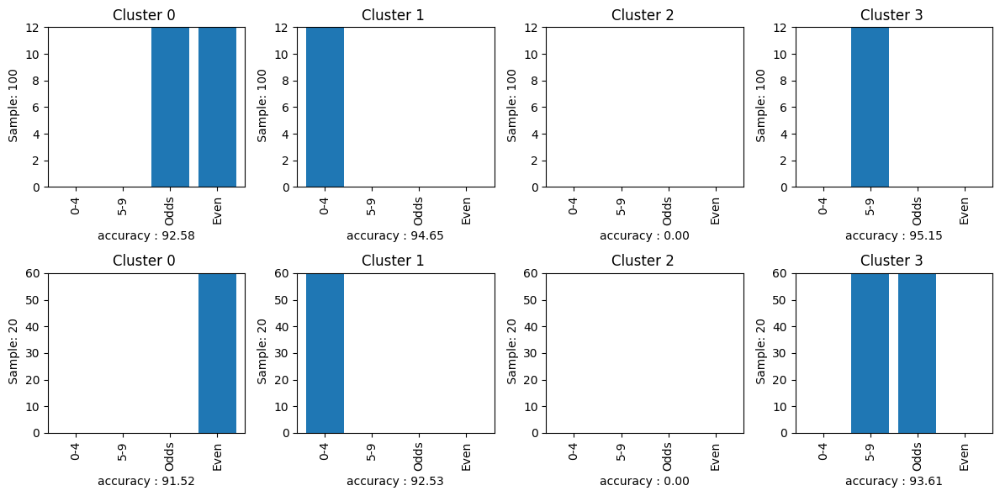

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
# Assuming your DataFrame is named df
df = client_df

# Add new columns and set values to 0
#new_columns = ['Cluster 2.members_heterogeneity.dilatation', 'Cluster 2.members_heterogeneity.none']
#df = df.assign(**{col: 0 for col in new_columns})

# Selecting the columns of interest for each cluster
columns_of_interest_cluster0 = ['Cluster 0.members_heterogeneity.([0, 1, 2, 3, 4], [0.1, 0.1, 0.1, 0.1, 0.1])', 
                                'Cluster 0.members_heterogeneity.([5, 6, 7, 8, 9], [0.1, 0.1, 0.1, 0.1, 0.1])',
                                'Cluster 0.members_heterogeneity.([1, 3, 5, 7, 9], [0.1, 0.1, 0.1, 0.1, 0.1])',
                                'Cluster 0.members_heterogeneity.([0, 2, 4, 6, 8], [0.1, 0.1, 0.1, 0.1, 0.1])',
                                ]

columns_of_interest_cluster1 = ['Cluster 1.members_heterogeneity.([0, 1, 2, 3, 4], [0.1, 0.1, 0.1, 0.1, 0.1])', 
                                'Cluster 1.members_heterogeneity.([5, 6, 7, 8, 9], [0.1, 0.1, 0.1, 0.1, 0.1])',
                                'Cluster 1.members_heterogeneity.([1, 3, 5, 7, 9], [0.1, 0.1, 0.1, 0.1, 0.1])',
                                'Cluster 1.members_heterogeneity.([0, 2, 4, 6, 8], [0.1, 0.1, 0.1, 0.1, 0.1])',
                                ]
columns_of_interest_cluster2 = ['Cluster 2.members_heterogeneity.([0, 1, 2, 3, 4], [0.1, 0.1, 0.1, 0.1, 0.1])', 
                                'Cluster 2.members_heterogeneity.([5, 6, 7, 8, 9], [0.1, 0.1, 0.1, 0.1, 0.1])',
                                'Cluster 2.members_heterogeneity.([1, 3, 5, 7, 9], [0.1, 0.1, 0.1, 0.1, 0.1])',
                                'Cluster 2.members_heterogeneity.([0, 2, 4, 6, 8], [0.1, 0.1, 0.1, 0.1, 0.1])',
                                ]
columns_of_interest_cluster3 = ['Cluster 3.members_heterogeneity.([0, 1, 2, 3, 4], [0.1, 0.1, 0.1, 0.1, 0.1])', 
                                'Cluster 3.members_heterogeneity.([5, 6, 7, 8, 9], [0.1, 0.1, 0.1, 0.1, 0.1])',
                                'Cluster 3.members_heterogeneity.([1, 3, 5, 7, 9], [0.1, 0.1, 0.1, 0.1, 0.1])',
                                'Cluster 3.members_heterogeneity.([0, 2, 4, 6, 8], [0.1, 0.1, 0.1, 0.1, 0.1])',
                                ]
columns_to_search = columns_of_interest_cluster0+ columns_of_interest_cluster1 +columns_of_interest_cluster2 + columns_of_interest_cluster3 +['Cluster 2.accuracy']
for column in columns_to_search:
    if column not in df.columns:
        df[column] = 0
# Creating subplots
fig, axs = plt.subplots(len(df), len(columns_of_interest_cluster0), figsize=(3*len(columns_of_interest_cluster0), 3*len(df)))

# Plotting bar plots for each row and each cluster
for i, (index, row) in enumerate(df.iterrows()):
    sample_name = row['samples']  # Get the value of 'samples' column for the current row
    max_value = max(row[columns_of_interest_cluster0].max(),
                    row[columns_of_interest_cluster1].max(),
                    row[columns_of_interest_cluster2].max(),row[columns_of_interest_cluster3].max())
    
    for j, columns_of_interest in enumerate([columns_of_interest_cluster0,
                                             columns_of_interest_cluster1,
                                             columns_of_interest_cluster2,columns_of_interest_cluster3]):
        axs[i, j].bar(range(len(columns_of_interest)), row[columns_of_interest], align='center')
        axs[i, j].set_xticks(range(len(columns_of_interest)))
        axs[i, j].set_xticklabels(['0-4','5-9','Odds', 'Even'], rotation=90)
        axs[i, j].set_title(f"Cluster {j} ")
        accuracy = row[f'Cluster {j}.accuracy']
        axs[i, j].set_xlabel(f"accuracy : {accuracy:.2f}")
        axs[i, j].set_ylabel(f" Sample: {sample_name}")
        axs[i, j].set_ylim(0, max_value)  # Set y-axis limits to the maximum value across all clusters

plt.tight_layout()
plt.show()

## Plot T-SNE Client SIDE

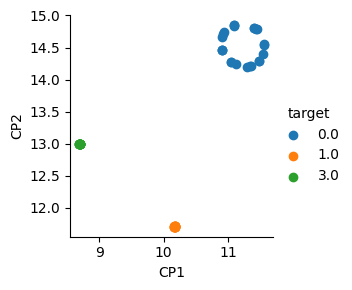

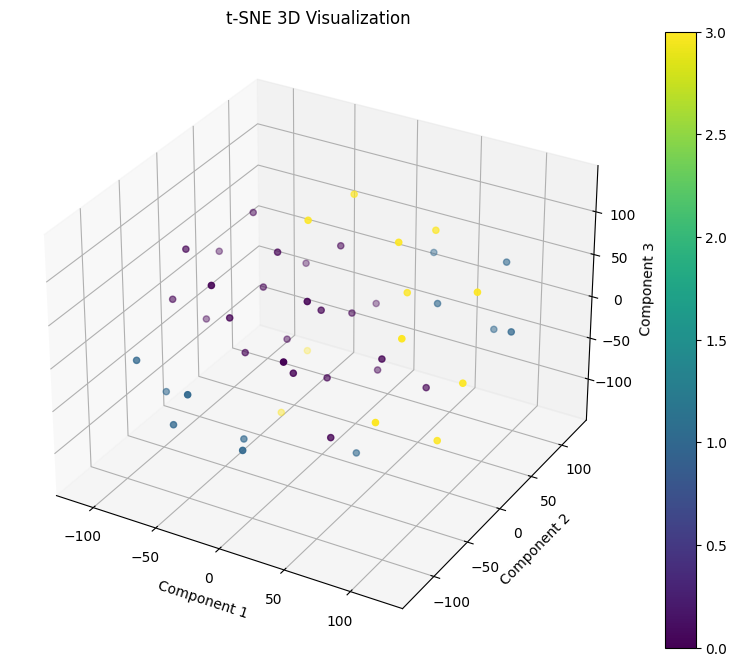

In [14]:
import pickle
import pandas as pd
df = pd.read_pickle('./results/labels_distribution_skew_balancing_client48_client_weights.pkl')
cluster = df['cluster']
df.drop(columns='cluster')
print('')
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn import datasets
from sklearn import manifold
import sklearn.manifold._t_sne as tsne
X = df
y= cluster
tsne = manifold.TSNE(n_components=2, random_state=42)
mnist_tr = tsne.fit_transform(X)
# create dataframe
tsne_df = pd.DataFrame(columns=['CP1', 'CP2', 'target'],
                       data=np.column_stack((mnist_tr, 
                                            cluster)))
# cast targets column to int
tsne_df.loc[:, 'target'] = tsne_df.target.astype(int)
grid = sns.FacetGrid(tsne_df, hue="target")
grid.map(plt.scatter, 'CP1', 'CP2').add_legend()
X = df
y= cluster
tsne = manifold.TSNE(n_components=3, random_state=42)
mnist_tr = tsne.fit_transform(X)
# create dataframe
tsne_df = pd.DataFrame(columns=['CP1', 'CP2','CP3' ,'target'],
                       data=np.column_stack((mnist_tr, 
                                            cluster)))
# cast targets column to int
tsne_df.loc[:, 'target'] = tsne_df.target.astype(int)
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Create a 3D scatter plot using Matplotlib directly
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot the data points
scatter = ax.scatter(tsne_df['CP1'], tsne_df['CP2'], tsne_df['CP3'], c=tsne_df['target'], cmap='viridis')

# Set labels and title
ax.set_xlabel('Component 1')
ax.set_ylabel('Component 2')
ax.set_zlabel('Component 3')
ax.set_title('t-SNE 3D Visualization')

# Add color bar
plt.colorbar(scatter)

plt.show()

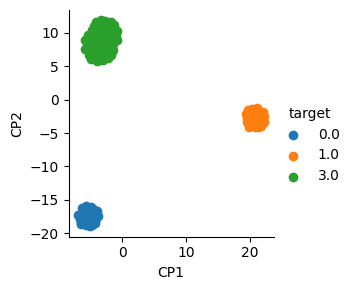

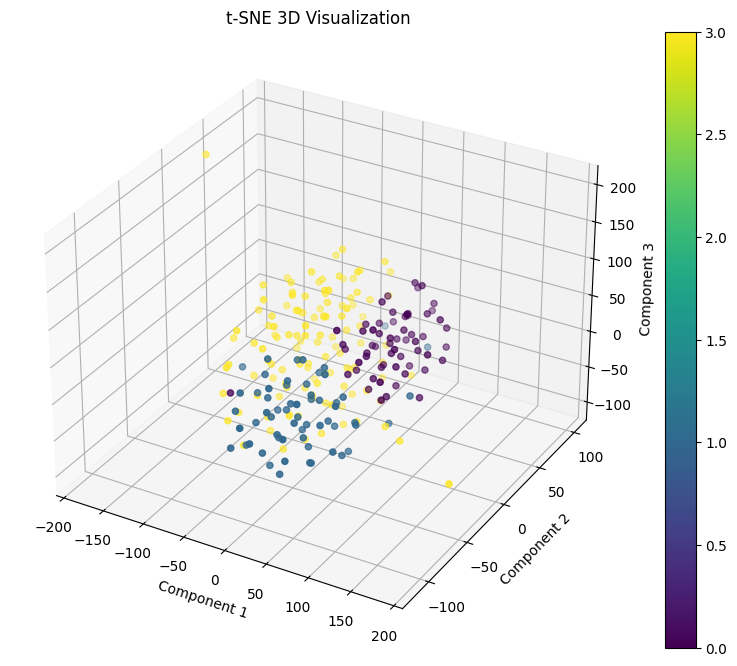

In [13]:
import pickle
import pandas as pd
df = pd.read_pickle('./results/labels_distribution_skew_balancing_client240_client_weights.pkl')
cluster = df['cluster']
df.drop(columns='cluster')
print('')
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn import datasets
from sklearn import manifold
import sklearn.manifold._t_sne as tsne
X = df
y= cluster
tsne = manifold.TSNE(n_components=2, random_state=42)
mnist_tr = tsne.fit_transform(X)
# create dataframe
tsne_df = pd.DataFrame(columns=['CP1', 'CP2', 'target'],
                       data=np.column_stack((mnist_tr, 
                                            cluster)))
# cast targets column to int
tsne_df.loc[:, 'target'] = tsne_df.target.astype(int)
grid = sns.FacetGrid(tsne_df, hue="target")
grid.map(plt.scatter, 'CP1', 'CP2').add_legend()
X = df
y= cluster
tsne = manifold.TSNE(n_components=3, random_state=42)
mnist_tr = tsne.fit_transform(X)
# create dataframe
tsne_df = pd.DataFrame(columns=['CP1', 'CP2','CP3' ,'target'],
                       data=np.column_stack((mnist_tr, 
                                            cluster)))
# cast targets column to int
tsne_df.loc[:, 'target'] = tsne_df.target.astype(int)
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Create a 3D scatter plot using Matplotlib directly
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot the data points
scatter = ax.scatter(tsne_df['CP1'], tsne_df['CP2'], tsne_df['CP3'], c=tsne_df['target'], cmap='viridis')

# Set labels and title
ax.set_xlabel('Component 1')
ax.set_ylabel('Component 2')
ax.set_zlabel('Component 3')
ax.set_title('t-SNE 3D Visualization')

# Add color bar
plt.colorbar(scatter)

plt.show()

## Plot weight heatmap Client SIDE

In [15]:
import torch
import glob
import os

from src.models import SimpleLinear
from src.metrics import plot_weights_heatmap
model = SimpleLinear()

# Define the directories
central_dir = "./results/labels_distribution_skew_balancing_central"
client_dir = "./results/labels_distribution_skew_balancing_client"
server_dir = "./results/labels_distribution_skew_balancing_server"

# Function to load .pth files from a directory into a dictionary
def load_pth_files(directory):
    pth_files = glob.glob(directory + "*.pth")
    models_dict = {}
    for pth_file in pth_files:
        filename = os.path.basename(pth_file)[:-4]  # Remove ".pth" extension
        model = torch.load(pth_file)
        models_dict[filename] = model
    return models_dict

# Load models from each directory
central_models_dict = load_pth_files(central_dir)
client_models_dict = load_pth_files(client_dir)
server_models_dict = load_pth_files(server_dir)

In [16]:
import matplotlib.pyplot as plt
def plot_weights_heatmap(model,title,title2 = '', v_value=0.1 ):
    # Get the weights of the first and second layers
    first_layer_weights = model.fc1.weight.data.numpy()
    second_layer_weights = model.fc2.weight.data.numpy()

    # Create custom colormap
    cmap = 'coolwarm'

    # Plot the input weights of the first layer
    plt.figure(figsize=(5, 3))

    #plt.subplot(2, 1, 1)
    plt.imshow(first_layer_weights, cmap=cmap, aspect='auto', vmin=-v_value, vmax=v_value)
    plt.title(title)
    plt.xlabel('Input Pixel (784)')
    plt.ylabel('Neuron in Hidden Layer (200)')
    plt.colorbar(label='Weight Value')
    plt.tight_layout()
    #plt.savefig(title + '.jpg')  
    plt.show()

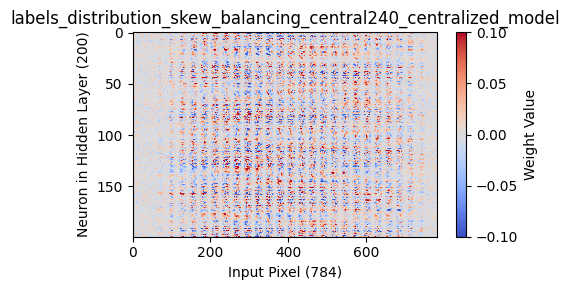

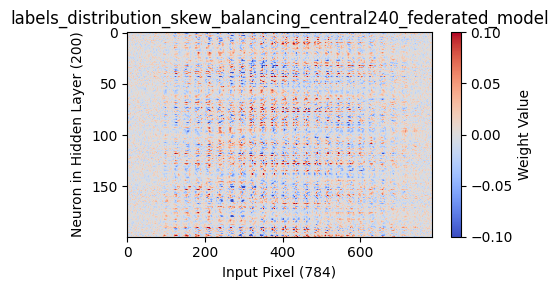

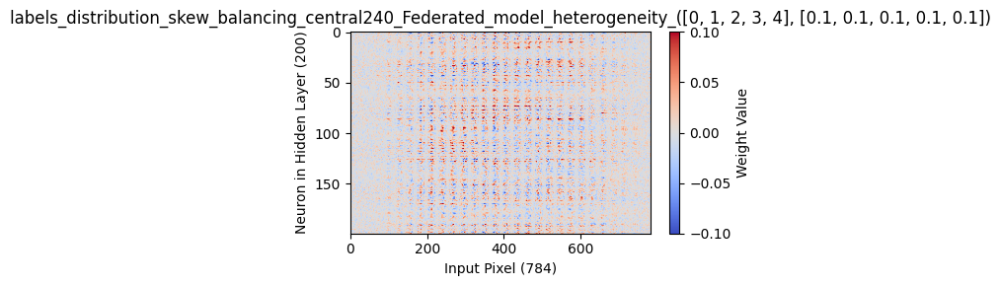

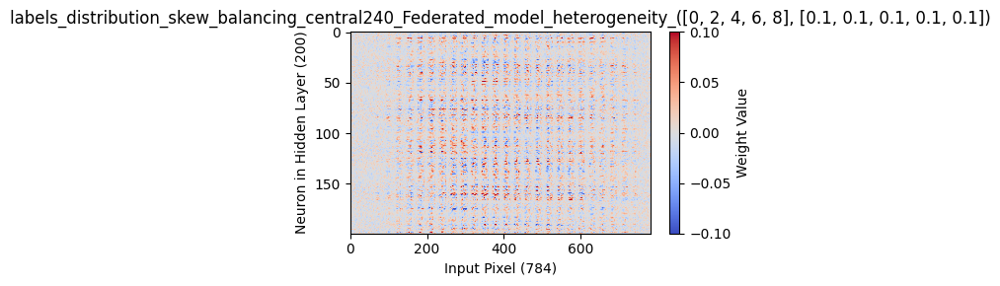

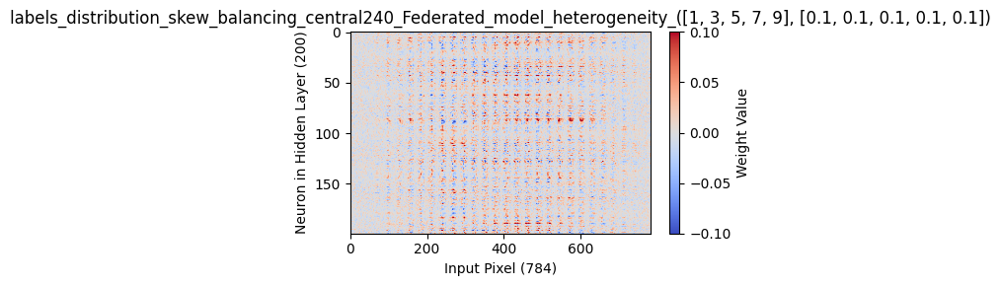

...

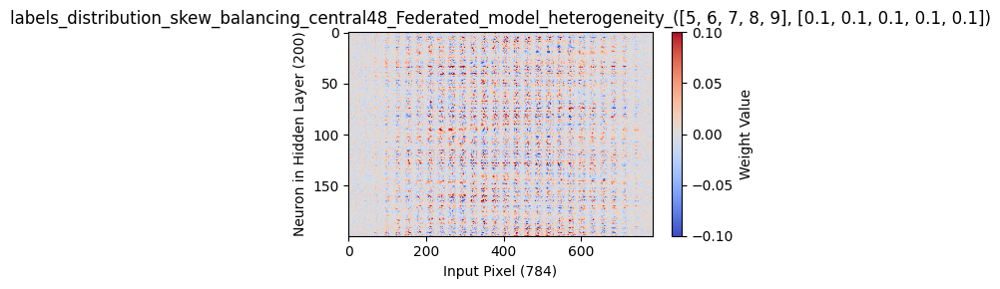

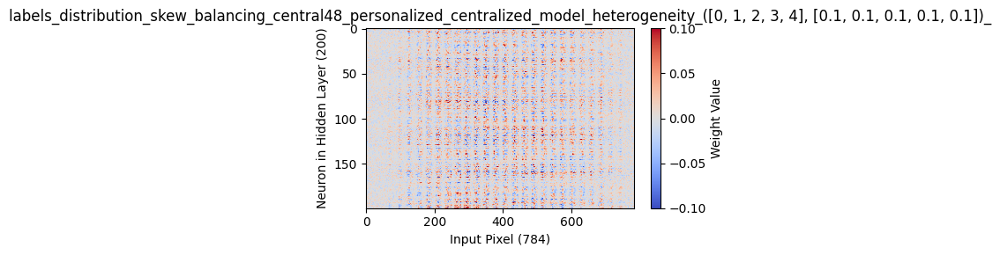

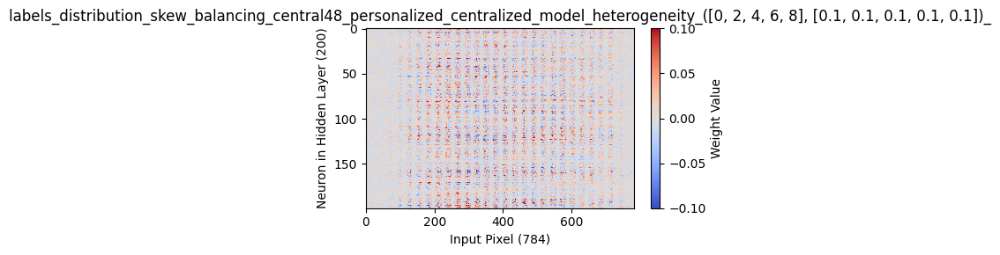

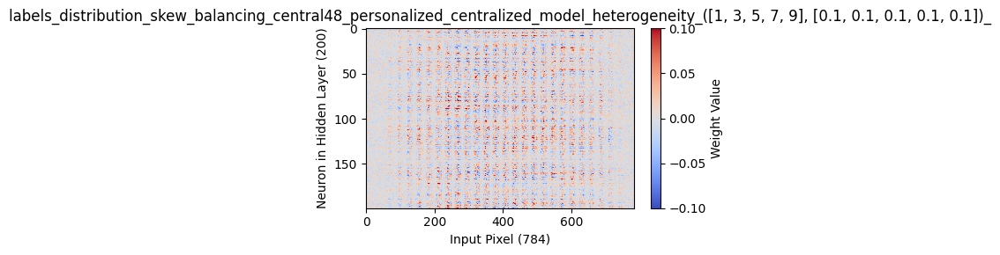

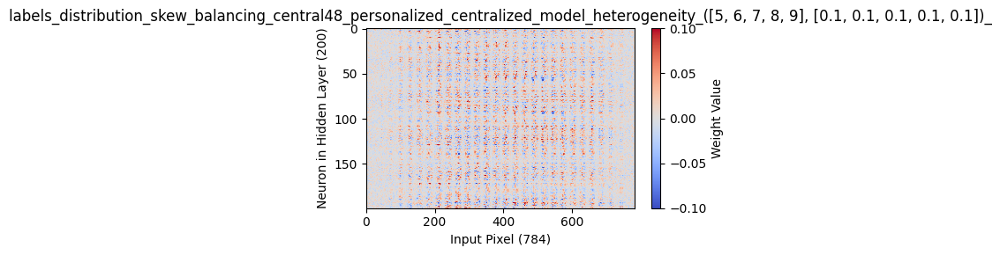

In [17]:
key_list =[]
for key in central_models_dict.keys() :
    key_list.append(key)
for key in key_list :
    model.load_state_dict(central_models_dict[key])
    plot_weights_heatmap(model,key)

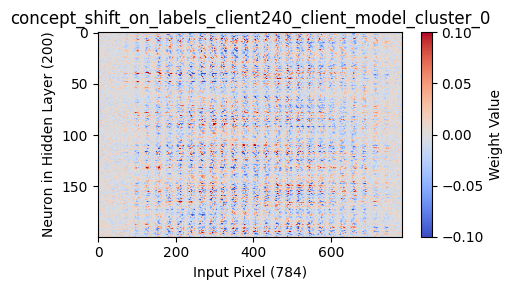

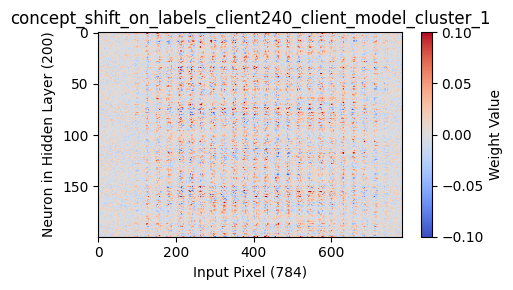

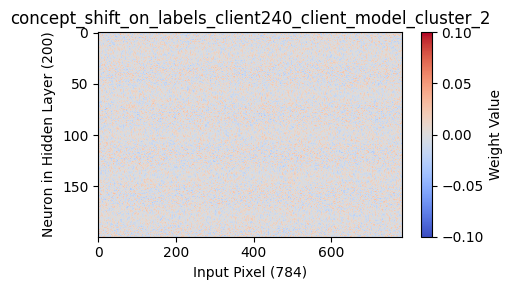

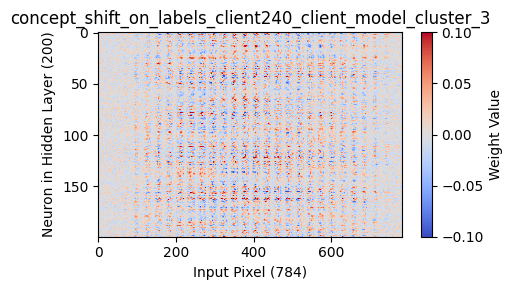

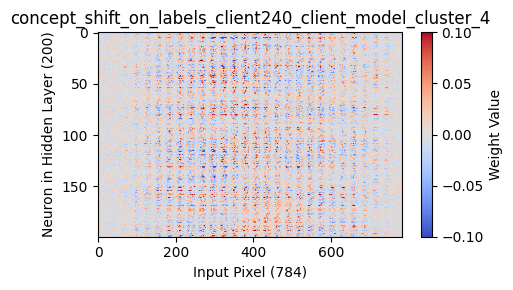

...

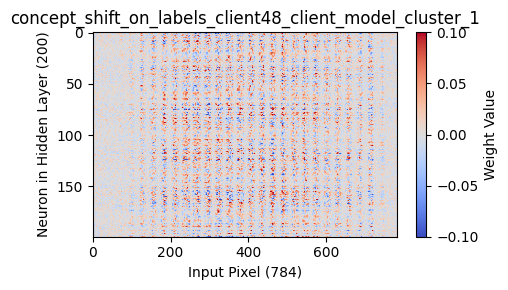

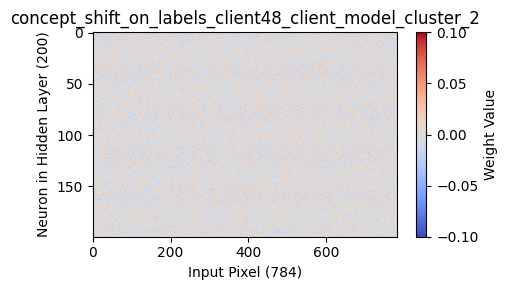

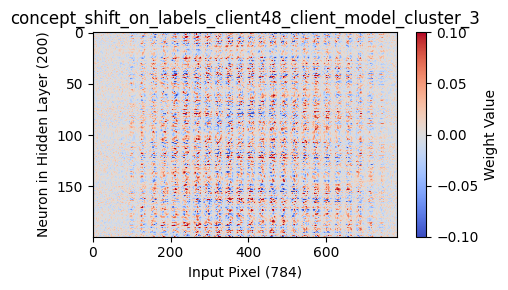

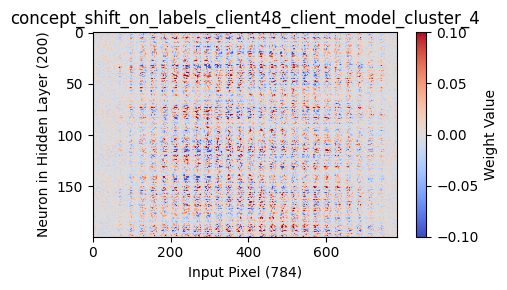

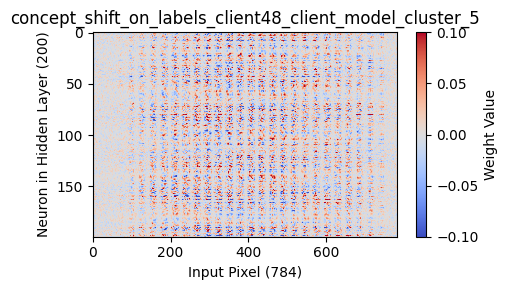

In [20]:
key_list =[]
for key in client_models_dict.keys() :
    key_list.append(key)
for key in key_list :
    model.load_state_dict(client_models_dict[key])
    plot_weights_heatmap(model,key)

# CFL SERVER SIDE

In [8]:
server_df['total'] = server_df['samples']*server_df['clients']
print('SERVERSIDE')
server_df = server_df.sort_values(by=['total','samples'], ascending=True)
display(server_df.transpose())

SERVERSIDE


,0,1
clients,240.000000,48.000000
samples,20.000000,100.000000
cfl_before_cluster_rounds,100.000000,50.000000
cfl_after_cluster_rounds,100.000000,50.000000
cfl_local_epochs,10.000000,50.000000
silhouette,0.907835,0.815525
avg_intra_dist,0.032511,0.109645
duhn_index,3.878707,1.610363
dbi,0.089939,0.121949
Cluster 0.num_members,119.000000,34.000000


In [9]:
from IPython.display import display
server_df = server_df.sort_values(by='clients', ascending=True)
# Select the columns for each DataFrame
display(server_df[['clients','samples','silhouette',	'avg_intra_dist',	'duhn_index', 'dbi']])
# Create new DataFrames
cluster_columns = [col for col in server_df.columns if col.startswith('Cluster')]
cluster_dfs = {}
for i in range(6):  # Assuming you want to create 4 new DataFrames
    cluster_dfs[i] = server_df[['clients', 'samples'] + [col for col in cluster_columns if col.startswith(f'Cluster {i}')]]
    display(cluster_dfs[i].transpose())

,clients,samples,silhouette,avg_intra_dist,duhn_index,dbi
1,48,100,0.815525,0.109645,1.610363,0.121949
0,240,20,0.907835,0.032511,3.878707,0.089939


,1,0
clients,48.000000,240.000000
samples,100.000000,20.000000
Cluster 0.num_members,34.000000,119.000000
Cluster 0.accuracy,94.313725,92.335116
Cluster 0.std,2.185255,3.925040
"Cluster 0.members_heterogeneity.([0, 1, 2, 3, 4], [0.1, 0.1, 0.1, 0.1, 0.1])",11.000000,60.000000
"Cluster 0.members_heterogeneity.([0, 2, 4, 6, 8], [0.1, 0.1, 0.1, 0.1, 0.1])",12.000000,59.000000
"Cluster 0.members_heterogeneity.([1, 3, 5, 7, 9], [0.1, 0.1, 0.1, 0.1, 0.1])",11.000000,NaN


,1,0
clients,48.000000,240.000000
samples,100.000000,20.000000
Cluster 1.num_members,1.000000,59.000000
Cluster 1.accuracy,96.363636,94.966615
Cluster 1.std,0.000000,4.449778
"Cluster 1.members_heterogeneity.([1, 3, 5, 7, 9], [0.1, 0.1, 0.1, 0.1, 0.1])",1.000000,59.000000


,1,0
clients,48.000000,240.000000
samples,100.000000,20.000000
Cluster 2.num_members,12.000000,61.000000
Cluster 2.accuracy,95.757576,93.939394
Cluster 2.std,1.049728,3.680802
"Cluster 2.members_heterogeneity.([1, 3, 5, 7, 9], [0.1, 0.1, 0.1, 0.1, 0.1])",NaN,1.000000
"Cluster 2.members_heterogeneity.([5, 6, 7, 8, 9], [0.1, 0.1, 0.1, 0.1, 0.1])",12.000000,60.000000


,1,0
clients,48.000000,240.000000
samples,100.000000,20.000000
Cluster 3.num_members,1.000000,1.000000
Cluster 3.accuracy,93.333333,93.939394
Cluster 3.std,0.000000,0.000000
"Cluster 3.members_heterogeneity.([0, 2, 4, 6, 8], [0.1, 0.1, 0.1, 0.1, 0.1])",NaN,1.000000
"Cluster 3.members_heterogeneity.([0, 1, 2, 3, 4], [0.1, 0.1, 0.1, 0.1, 0.1])",1.000000,NaN


,1,0
clients,48,240
samples,100,20


,1,0
clients,48,240
samples,100,20


In [10]:
display(server_df[['Cluster 0.accuracy','Cluster 1.accuracy','Cluster 2.accuracy','Cluster 3.accuracy']].mean(axis=1))
server_df[['Cluster 0.accuracy','Cluster 1.accuracy','Cluster 2.accuracy','Cluster 3.accuracy']].std(axis=1)

1    94.942068
0    93.795130
dtype: float64

1    1.374621
0    1.087144
dtype: float64

## Histogram Server SIDE

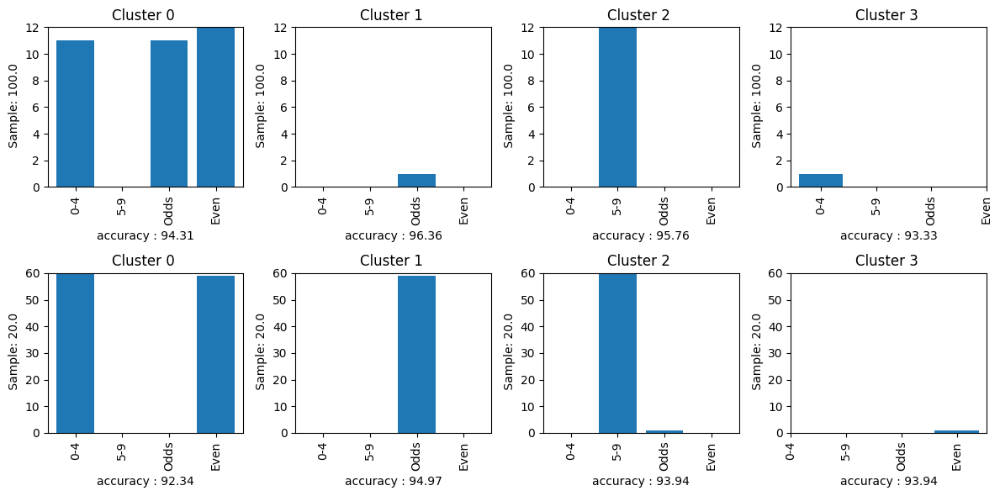

In [20]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming your DataFrame is named df
df = server_df

# Add new columns and set values to 0
#new_columns = ['Cluster 2.members_heterogeneity.dilatation', 'Cluster 2.members_heterogeneity.none']
#df = df.assign(**{col: 0 for col in new_columns})

# Selecting the columns of interest for each cluster
columns_of_interest_cluster0 = ['Cluster 0.members_heterogeneity.([0, 1, 2, 3, 4], [0.1, 0.1, 0.1, 0.1, 0.1])', 
                                'Cluster 0.members_heterogeneity.([5, 6, 7, 8, 9], [0.1, 0.1, 0.1, 0.1, 0.1])',
                                'Cluster 0.members_heterogeneity.([1, 3, 5, 7, 9], [0.1, 0.1, 0.1, 0.1, 0.1])',
                                'Cluster 0.members_heterogeneity.([0, 2, 4, 6, 8], [0.1, 0.1, 0.1, 0.1, 0.1])',
                                ]

columns_of_interest_cluster1 = ['Cluster 1.members_heterogeneity.([0, 1, 2, 3, 4], [0.1, 0.1, 0.1, 0.1, 0.1])', 
                                'Cluster 1.members_heterogeneity.([5, 6, 7, 8, 9], [0.1, 0.1, 0.1, 0.1, 0.1])',
                                'Cluster 1.members_heterogeneity.([1, 3, 5, 7, 9], [0.1, 0.1, 0.1, 0.1, 0.1])',
                                'Cluster 1.members_heterogeneity.([0, 2, 4, 6, 8], [0.1, 0.1, 0.1, 0.1, 0.1])',
                                ]
columns_of_interest_cluster2 = ['Cluster 2.members_heterogeneity.([0, 1, 2, 3, 4], [0.1, 0.1, 0.1, 0.1, 0.1])', 
                                'Cluster 2.members_heterogeneity.([5, 6, 7, 8, 9], [0.1, 0.1, 0.1, 0.1, 0.1])',
                                'Cluster 2.members_heterogeneity.([1, 3, 5, 7, 9], [0.1, 0.1, 0.1, 0.1, 0.1])',
                                'Cluster 2.members_heterogeneity.([0, 2, 4, 6, 8], [0.1, 0.1, 0.1, 0.1, 0.1])',
                                ]
columns_of_interest_cluster3 = ['Cluster 3.members_heterogeneity.([0, 1, 2, 3, 4], [0.1, 0.1, 0.1, 0.1, 0.1])', 
                                'Cluster 3.members_heterogeneity.([5, 6, 7, 8, 9], [0.1, 0.1, 0.1, 0.1, 0.1])',
                                'Cluster 3.members_heterogeneity.([1, 3, 5, 7, 9], [0.1, 0.1, 0.1, 0.1, 0.1])',
                                'Cluster 3.members_heterogeneity.([0, 2, 4, 6, 8], [0.1, 0.1, 0.1, 0.1, 0.1])',
                                ]
columns_to_search = columns_of_interest_cluster0+ columns_of_interest_cluster1 +columns_of_interest_cluster2 + columns_of_interest_cluster3 +['Cluster 2.accuracy']
for column in columns_to_search:
    if column not in df.columns:
        df[column] = 0
# Creating subplots
fig, axs = plt.subplots(len(df), len(columns_of_interest_cluster0), figsize=(3*len(columns_of_interest_cluster0), 3*len(df)))

# Plotting bar plots for each row and each cluster
for i, (index, row) in enumerate(df.iterrows()):
    sample_name = row['samples']  # Get the value of 'samples' column for the current row
    max_value = max(row[columns_of_interest_cluster0].max(),
                    row[columns_of_interest_cluster1].max(),
                    row[columns_of_interest_cluster2].max(),row[columns_of_interest_cluster3].max())
    
    for j, columns_of_interest in enumerate([columns_of_interest_cluster0,
                                             columns_of_interest_cluster1,
                                             columns_of_interest_cluster2,columns_of_interest_cluster3]):
        axs[i, j].bar(range(len(columns_of_interest)), row[columns_of_interest], align='center')
        axs[i, j].set_xticks(range(len(columns_of_interest)))
        axs[i, j].set_xticklabels(['0-4','5-9','Odds', 'Even'], rotation=90)
        axs[i, j].set_title(f"Cluster {j} ")
        accuracy = row[f'Cluster {j}.accuracy']
        axs[i, j].set_xlabel(f"accuracy : {accuracy:.2f}")
        axs[i, j].set_ylabel(f" Sample: {sample_name}")
        axs[i, j].set_ylim(0, max_value)  # Set y-axis limits to the maximum value across all clusters

plt.tight_layout()
plt.show()

## Plot T-SNE Server SIDE

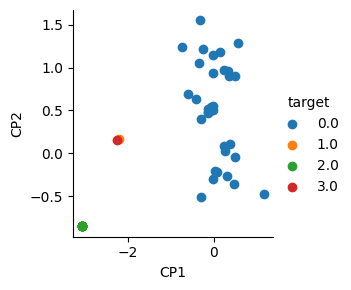

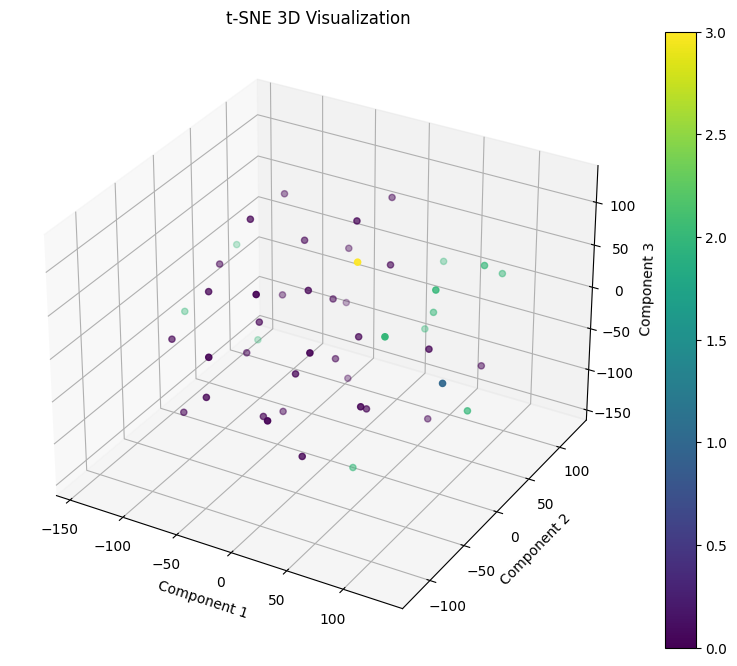

In [21]:
import pickle
import pandas as pd
df = pd.read_pickle('./results/labels_distribution_skew_balancing_server48_client_weights.pkl')
cluster = df['cluster']
df.drop(columns='cluster')
print('')
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn import datasets
from sklearn import manifold
import sklearn.manifold._t_sne as tsne
X = df
y= cluster
tsne = manifold.TSNE(n_components=2, random_state=42)
mnist_tr = tsne.fit_transform(X)
# create dataframe
tsne_df = pd.DataFrame(columns=['CP1', 'CP2', 'target'],
                       data=np.column_stack((mnist_tr, 
                                            cluster)))
# cast targets column to int
tsne_df.loc[:, 'target'] = tsne_df.target.astype(int)
grid = sns.FacetGrid(tsne_df, hue="target")
grid.map(plt.scatter, 'CP1', 'CP2').add_legend()
X = df
y= cluster
tsne = manifold.TSNE(n_components=3, random_state=42)
mnist_tr = tsne.fit_transform(X)
# create dataframe
tsne_df = pd.DataFrame(columns=['CP1', 'CP2','CP3' ,'target'],
                       data=np.column_stack((mnist_tr, 
                                            cluster)))
# cast targets column to int
tsne_df.loc[:, 'target'] = tsne_df.target.astype(int)
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Create a 3D scatter plot using Matplotlib directly
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot the data points
scatter = ax.scatter(tsne_df['CP1'], tsne_df['CP2'], tsne_df['CP3'], c=tsne_df['target'], cmap='viridis')

# Set labels and title
ax.set_xlabel('Component 1')
ax.set_ylabel('Component 2')
ax.set_zlabel('Component 3')
ax.set_title('t-SNE 3D Visualization')

# Add color bar
plt.colorbar(scatter)

plt.show()

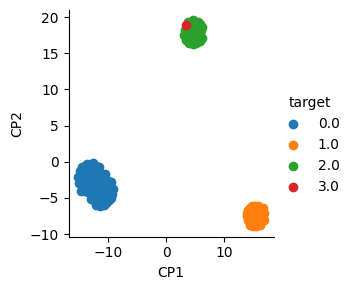

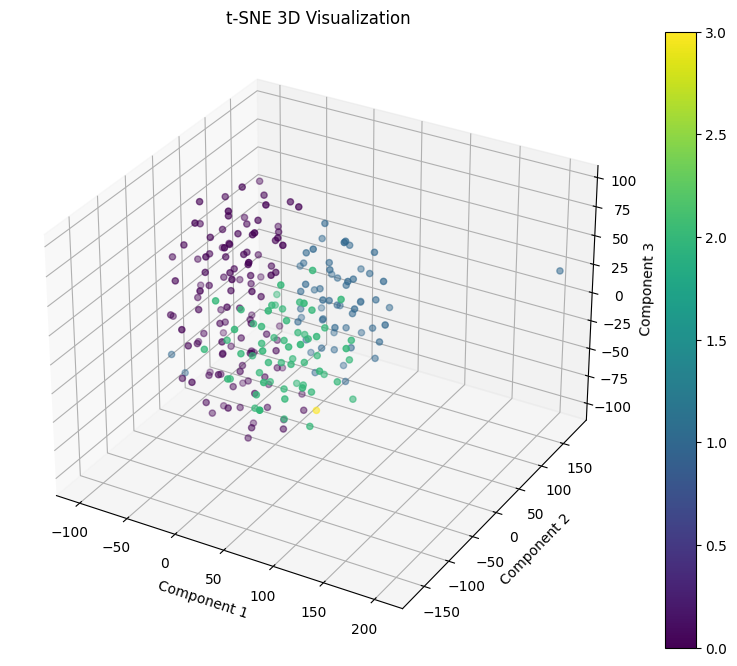

In [22]:
import pickle
import pandas as pd
df = pd.read_pickle('./results/labels_distribution_skew_balancing_server240_client_weights.pkl')
cluster = df['cluster']
df.drop(columns='cluster')
print('')
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn import datasets
from sklearn import manifold
import sklearn.manifold._t_sne as tsne
X = df
y= cluster
tsne = manifold.TSNE(n_components=2, random_state=42)
mnist_tr = tsne.fit_transform(X)
# create dataframe
tsne_df = pd.DataFrame(columns=['CP1', 'CP2', 'target'],
                       data=np.column_stack((mnist_tr, 
                                            cluster)))
# cast targets column to int
tsne_df.loc[:, 'target'] = tsne_df.target.astype(int)
grid = sns.FacetGrid(tsne_df, hue="target")
grid.map(plt.scatter, 'CP1', 'CP2').add_legend()
X = df
y= cluster
tsne = manifold.TSNE(n_components=3, random_state=42)
mnist_tr = tsne.fit_transform(X)
# create dataframe
tsne_df = pd.DataFrame(columns=['CP1', 'CP2','CP3' ,'target'],
                       data=np.column_stack((mnist_tr, 
                                            cluster)))
# cast targets column to int
tsne_df.loc[:, 'target'] = tsne_df.target.astype(int)
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Create a 3D scatter plot using Matplotlib directly
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot the data points
scatter = ax.scatter(tsne_df['CP1'], tsne_df['CP2'], tsne_df['CP3'], c=tsne_df['target'], cmap='viridis')

# Set labels and title
ax.set_xlabel('Component 1')
ax.set_ylabel('Component 2')
ax.set_zlabel('Component 3')
ax.set_title('t-SNE 3D Visualization')

# Add color bar
plt.colorbar(scatter)

plt.show()

## Plot weight heatmap server SIDE

In [23]:
import torch
import glob
import os

from src.models import SimpleLinear
from src.metrics import plot_weights_heatmap
model = SimpleLinear()

# Define the directories
central_dir = "./results/labels_distribution_skew_balancing_central"
client_dir = "./results/labels_distribution_skew_balancing_client"
server_dir = "./results/labels_distribution_skew_balancing_server"

# Function to load .pth files from a directory into a dictionary
def load_pth_files(directory):
    pth_files = glob.glob(directory + "*.pth")
    models_dict = {}
    for pth_file in pth_files:
        filename = os.path.basename(pth_file)[:-4]  # Remove ".pth" extension
        model = torch.load(pth_file)
        models_dict[filename] = model
    return models_dict

# Load models from each directory
central_models_dict = load_pth_files(central_dir)
client_models_dict = load_pth_files(client_dir)
server_models_dict = load_pth_files(server_dir)

In [24]:
import matplotlib.pyplot as plt
def plot_weights_heatmap(model,title,title2 = '', v_value=0.1 ):
    # Get the weights of the first and second layers
    first_layer_weights = model.fc1.weight.data.numpy()
    second_layer_weights = model.fc2.weight.data.numpy()

    # Create custom colormap
    cmap = 'coolwarm'

    # Plot the input weights of the first layer
    plt.figure(figsize=(5, 3))

    #plt.subplot(2, 1, 1)
    plt.imshow(first_layer_weights, cmap=cmap, aspect='auto', vmin=-v_value, vmax=v_value)
    plt.title(title)
    plt.xlabel('Input Pixel (784)')
    plt.ylabel('Neuron in Hidden Layer (200)')
    plt.colorbar(label='Weight Value')
    plt.tight_layout()
    #plt.savefig(title + '.jpg')  
    plt.show()
'''
    # Plot the output weights of the second layer
    plt.subplot(2, 1, 2)
    plt.imshow(second_layer_weights, cmap=cmap, aspect='auto', vmin=-v_value, vmax=v_value)
    plt.title(title2)
    plt.xlabel('Neuron in Hidden Layer(200)')
    plt.ylabel('Output Neuron (10)')
    plt.colorbar(label='Weight Value')

    plt.tight_layout()
    #plt.savefig(title + '.jpg')  
    plt.show()
    '''

"\n    # Plot the output weights of the second layer\n    plt.subplot(2, 1, 2)\n    plt.imshow(second_layer_weights, cmap=cmap, aspect='auto', vmin=-v_value, vmax=v_value)\n    plt.title(title2)\n    plt.xlabel('Neuron in Hidden Layer(200)')\n    plt.ylabel('Output Neuron (10)')\n    plt.colorbar(label='Weight Value')\n\n    plt.tight_layout()\n    #plt.savefig(title + '.jpg')  \n    plt.show()\n    "

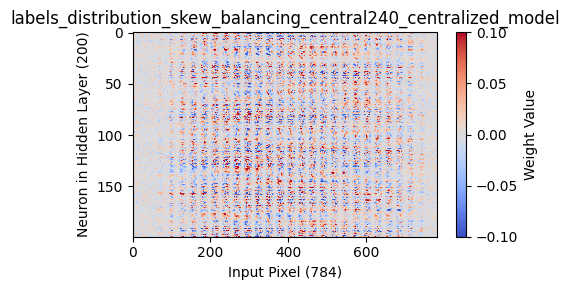

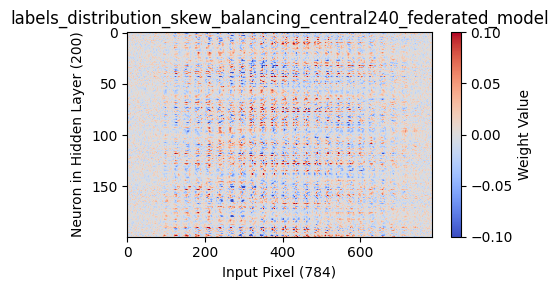

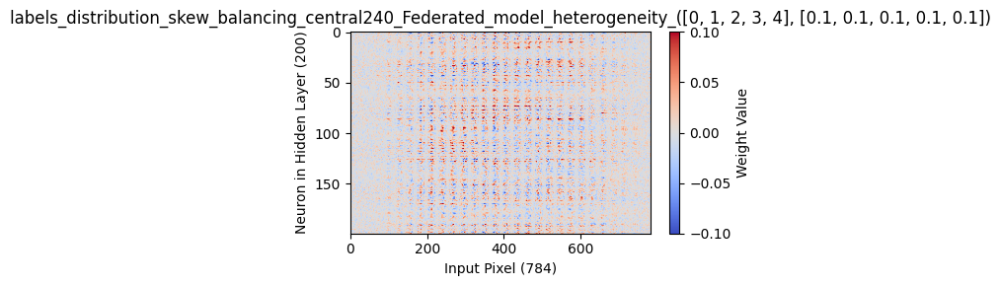

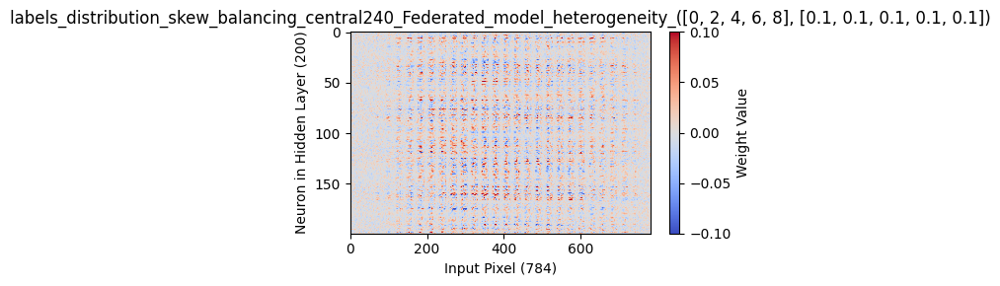

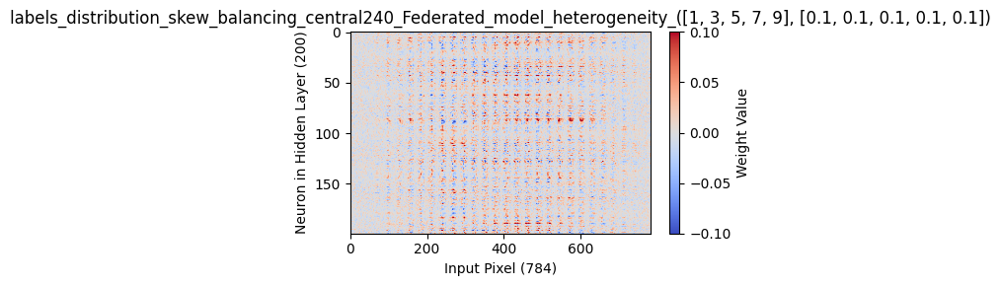

...

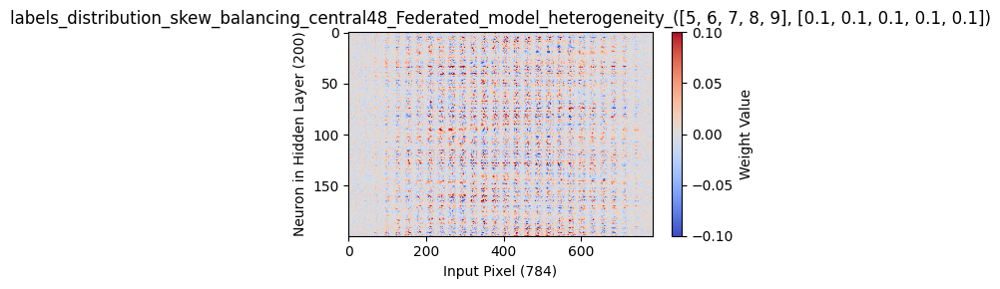

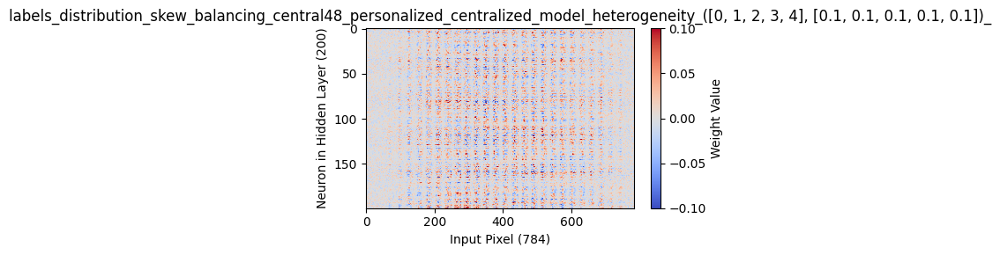

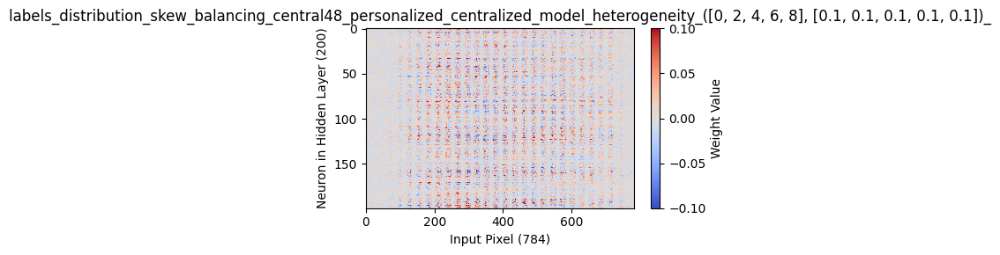

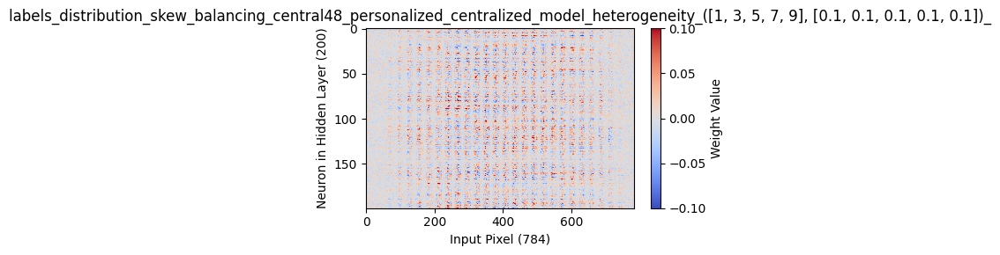

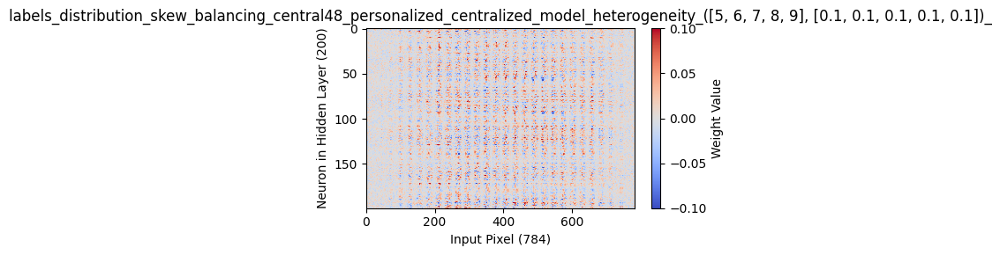

In [25]:
key_list =[]
for key in central_models_dict.keys() :
    key_list.append(key)
for key in key_list :
    model.load_state_dict(central_models_dict[key])
    plot_weights_heatmap(model,key)

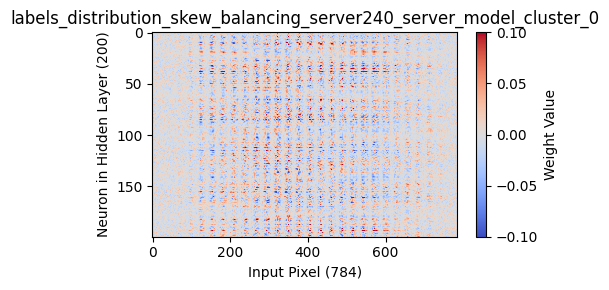

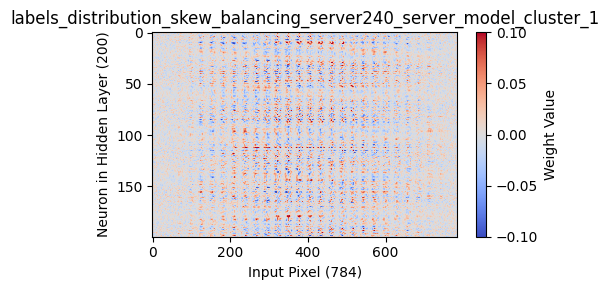

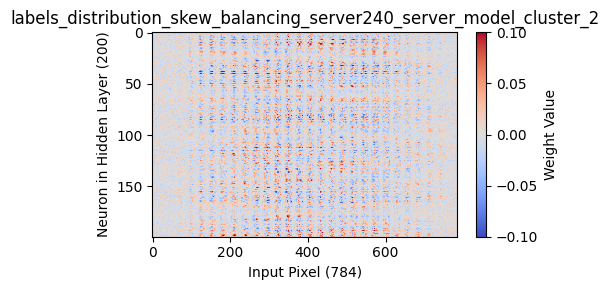

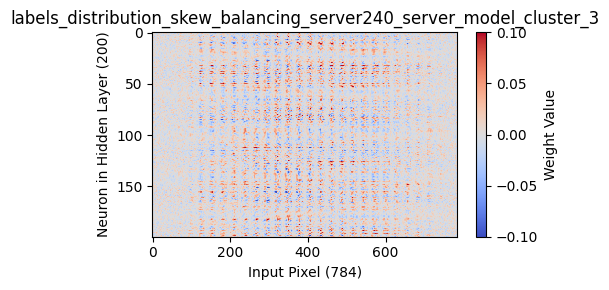

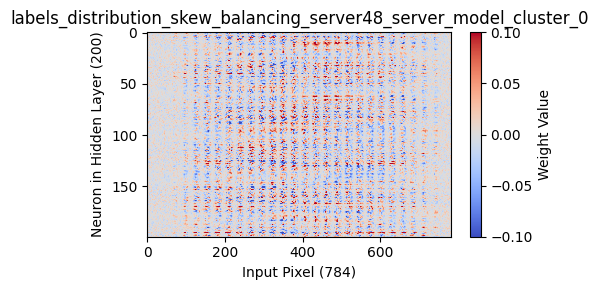

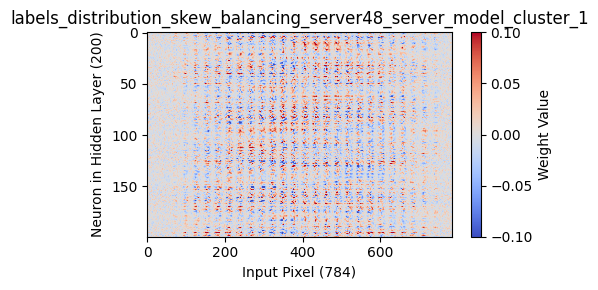

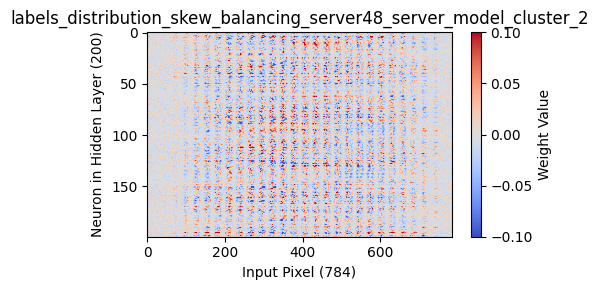

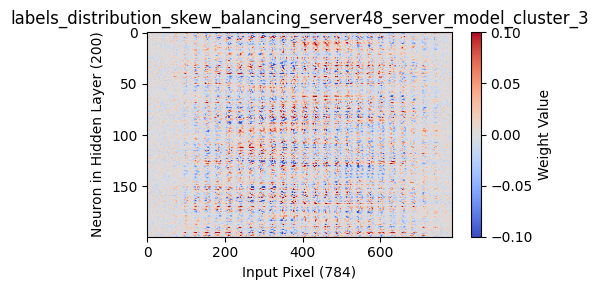

In [26]:
key_list =[]
for key in server_models_dict.keys() :
    key_list.append(key)
for key in key_list :
    model.load_state_dict(server_models_dict[key])
    plot_weights_heatmap(model,key)

# Similarity Matrix

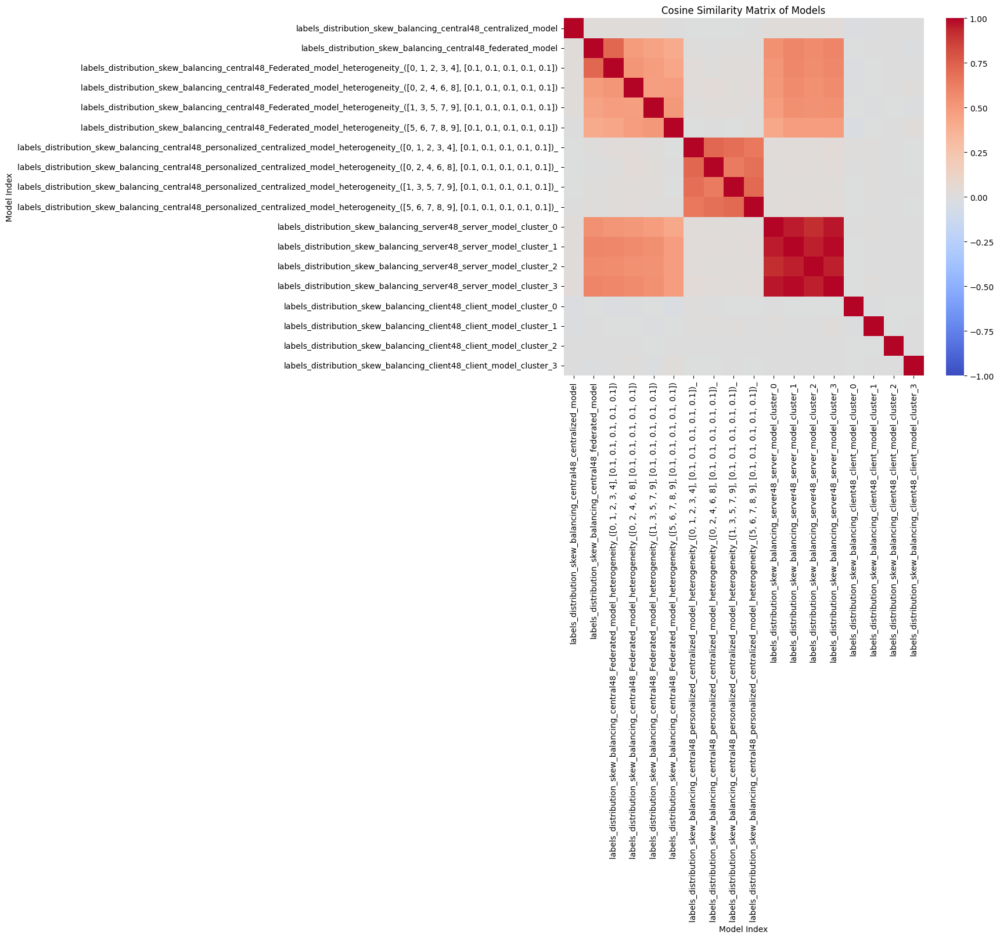

In [27]:
import torch
import glob
import os

from src.models import SimpleLinear
from src.metrics import plot_weights_heatmap
model = SimpleLinear()

# Define the directories
central_dir = "./results/labels_distribution_skew_balancing_central48"
client_dir = "./results/labels_distribution_skew_balancing_client48"
server_dir = "./results/labels_distribution_skew_balancing_server48"
# Function to load .pth files from a directory into a dictionary
def load_pth_files(directory):
    pth_files = glob.glob(directory + "*.pth")
    models_dict = {}
    for pth_file in pth_files:
        filename = os.path.basename(pth_file)[:-4]  # Remove ".pth" extension
        model = torch.load(pth_file)
        models_dict[filename] = model
    return models_dict

# Load models from each directory
central_models_dict = load_pth_files(central_dir)
client_models_dict = load_pth_files(client_dir)
server_models_dict = load_pth_files(server_dir)
import torch
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns
import matplotlib.pyplot as plt
key_list =[]
for key in central_models_dict.keys() :
  key_list.append(key)
for key in server_models_dict.keys() :
  key_list.append(key)
for key in client_models_dict.keys() :
  key_list.append(key)
# Load all the models using their state dicts
concatenated_dict = {}

concatenated_dict.update(central_models_dict)
concatenated_dict.update(server_models_dict)
concatenated_dict.update(client_models_dict)
models = []
for key in key_list:
    model = model = SimpleLinear()
  # Instantiate your PyTorch model
    model.load_state_dict(concatenated_dict[key])
    models.append(model)

# Extract parameters and flatten them
parameters = [torch.cat([param.view(-1) for param in model.parameters()]) for model in models]

# Compute cosine similarity matrix
cos_sim_matrix = cosine_similarity(torch.stack(parameters).detach().numpy())

# Plot heatmap with labels but without annotations
plt.figure(figsize=(10, 8))
sns.heatmap(cos_sim_matrix, cmap='coolwarm', center=0, xticklabels=key_list, yticklabels=key_list, annot=False, vmin=-1, vmax=1)
plt.title('Cosine Similarity Matrix of Models')
plt.xlabel('Model Index')
plt.ylabel('Model Index')
plt.show()

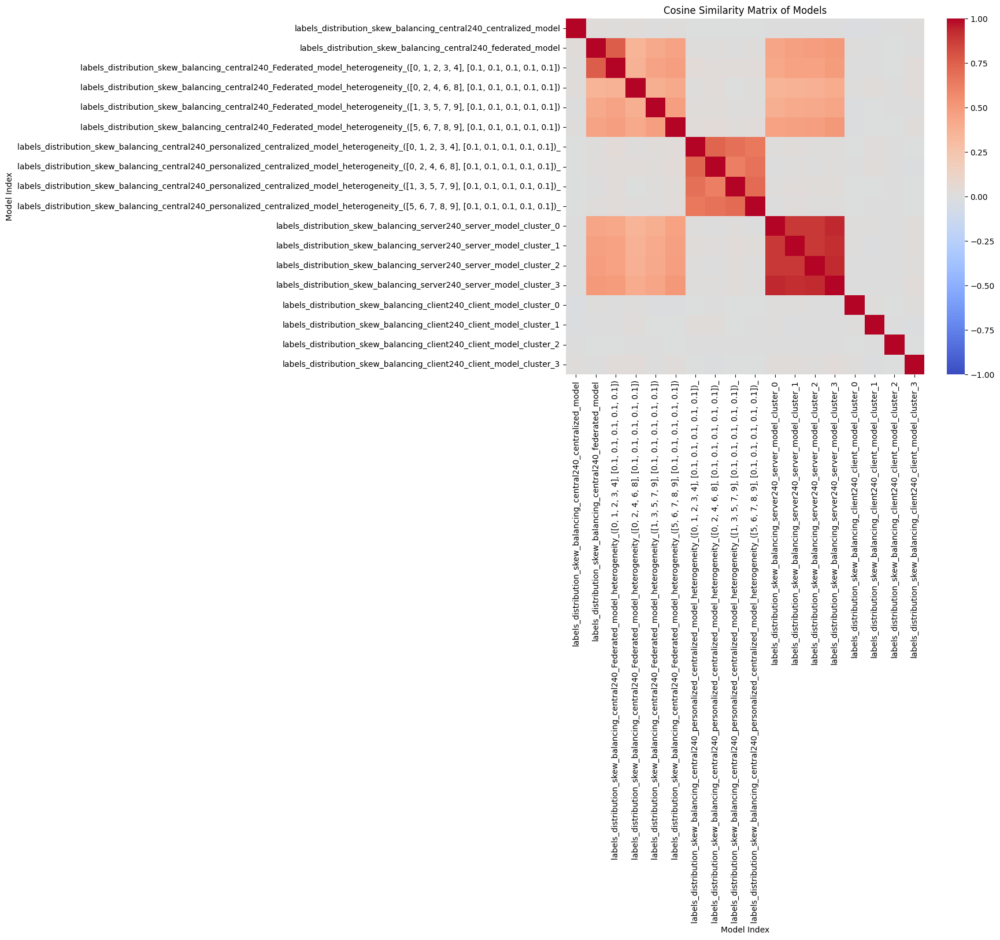

In [28]:
import torch
import glob
import os

from src.models import SimpleLinear
from src.metrics import plot_weights_heatmap
model = SimpleLinear()

# Define the directories
central_dir = "./results/labels_distribution_skew_balancing_central240"
client_dir = "./results/labels_distribution_skew_balancing_client240"
server_dir = "./results/labels_distribution_skew_balancing_server240"

# Function to load .pth files from a directory into a dictionary
def load_pth_files(directory):
    pth_files = glob.glob(directory + "*.pth")
    models_dict = {}
    for pth_file in pth_files:
        filename = os.path.basename(pth_file)[:-4]  # Remove ".pth" extension
        model = torch.load(pth_file)
        models_dict[filename] = model
    return models_dict

# Load models from each directory
central_models_dict = load_pth_files(central_dir)
client_models_dict = load_pth_files(client_dir)
server_models_dict = load_pth_files(server_dir)
import torch
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns
import matplotlib.pyplot as plt
key_list =[]
for key in central_models_dict.keys() :
  key_list.append(key)
for key in server_models_dict.keys() :
  key_list.append(key)
for key in client_models_dict.keys() :
  key_list.append(key)
# Load all the models using their state dicts
concatenated_dict = {}

concatenated_dict.update(central_models_dict)
concatenated_dict.update(server_models_dict)
concatenated_dict.update(client_models_dict)
models = []
for key in key_list:
    model = model = SimpleLinear()
  # Instantiate your PyTorch model
    model.load_state_dict(concatenated_dict[key])
    models.append(model)

# Extract parameters and flatten them
parameters = [torch.cat([param.view(-1) for param in model.parameters()]) for model in models]

# Compute cosine similarity matrix
cos_sim_matrix = cosine_similarity(torch.stack(parameters).detach().numpy())

# Plot heatmap with labels but without annotations
plt.figure(figsize=(10, 8))
sns.heatmap(cos_sim_matrix, cmap='coolwarm', center=0, xticklabels=key_list, yticklabels=key_list, annot=False, vmin=-1, vmax=1)
plt.title('Cosine Similarity Matrix of Models')
plt.xlabel('Model Index')
plt.ylabel('Model Index')
plt.show()